In [28]:
include("TKTD_04_boilerplate_dl_ni.jl"); # set up simulation and load default parameters for d magna

  Activating project at `c:\Users\shansul\Documents\Research\COM-MET-MIX\WP2\TKTD_calibrations\TKTD_calibrations`

In [29]:
theme(:ggplot2) # ggplot theme works better in jupyter 
default(leg=false)

In [30]:
# using the longispina AMP parameters as default
default_flea_params = copy(default_fleas[:DL_AMP])
# turn off ageing and adaptive plasticity by default
default_flea_params[:h_a_accel] = 0.
default_flea_params[:e_50_adpt] = 1e-10
default_flea_params[:beta_e_adpt] = 10.

# phytoplankton (food) parameters
phyto_params = [copy(default_phyto.Rsub)]

1-element Vector{OrderedDict{Symbol, Any}}:
 OrderedDict(:species => "Rsub", :mu_max => 1.78, :q_max => 0.018, :q_min => 0.0011, :q_init => 1.0, :v_max => 0.062, :k_s => 0.0625, :m_max => 0.0, :I_opt => 120.0, :T_opt => 28.0…)

# Implementation verification

The following code has the purpose to validate the DEB-IBM implementation for each submodel. <br>
An abbreviated version will be provided in the TRACE documentation.

To facilitate comparison of model output with analytical solutions, some changes to the simulation settings are made:

In [31]:
default_global_params[:A_inoculate] = [100.] # => f=1
default_global_params[:renew_medium] = Int64[] # no renewals
default_global_params[:remove_juveniles] = 0:7 |> collect; # remove juveniles immediately
default_global_params[:age_init_max] = 1e-7; # start directly at birth

In [32]:
default_global_params[:data_recording_interval] = 1.;

## DEB

### Embryonal development time ("age at birth")

According To Kooijman (2010), age at birth (i.e., embryonal development time) can be predicted analytically when $g$ is small and $\dot{k}_M$ is large:

$$
a_b = \frac{3l_b}{\dot{k}_M g}\left( 1 + \frac{g}{f} \right)
$$

, with  $L_{max}=\kappa \frac{\left\{ \dot{p}_{A,max} \right\}}{\left[ \dot{p}_M \right]}$, 
$g=\frac{
[E_G]\dot{v}
}{
\kappa \left\{ \dot{p}_{A,max} \right\}
}$ and $\dot{k}_M=\frac{\left[ \dot{p}_M \right]}{E_G}$.

This equation also requires that $f$ is equal to scaled reserve density at birth, $e_b$. <br>
$l$ is length $L$ scaled by maximum length $L_{max}$. <br>
We know all the inputs except for $l_b$. So we cannot calculate $a_b$ directly, but we can check for consistency by inserting $l_b$ from the simulation output table, calculating $a_b$ correspondingly, and comparing with $a_b$ in the simulation output table (which is the actual age at birth that results from simulating embryonal development).

In [33]:
function L_max(
        kappa::Float64,
        p_A_m::Float64,
        p_M_V::Float64
    )
    return kappa*(p_A_m/p_M_V)
end

function g(
        E_G::Float64, 
        v::Float64, 
        kappa::Float64, 
        p_A_m::Float64)
    return (E_G*v)/(kappa*p_A_m)
end

function k_M(
        p_M_V::Float64,
        E_G::Float64
    )
    return p_M_V/E_G
end

k_M (generic function with 1 method)

In [34]:
"""
Calculate age at birth for small g and large k_M. 
$(TYPEDSIGNATURES)
"""
function age_at_birth(
        L_b::Float64,
        L_max::Float64,
        k_M::Float64,
        g::Float64,
        f::Float64
    )
    let l_b=L_b/L_max
        return ((3l_b)/(k_M*g))*(1+(g/f))
    end
end

age_at_birth

The code below will run simulation of a life-table experiment for a single test animal, and show output for length and age at birth for a single individual.

In [35]:
flea_params = deepcopy(default_flea_params) 

out = life_table(default_global_params, phyto_params, flea_params; n_reps=1)
L_b_sim, a_b_sim = @subset(out.repro, :t_day.==minimum(:t_day))[1,[:L, :age]]

,L,age
,Any,Any
1,0.017281,3.25


This code cell will show the analytical solution, making use of the simulated $L_b$. The value that is printed should be equal to "age" in the table above.

In [36]:
L_max_anl = L_max(flea_params[:kappa_0], flea_params[:p_A_m_0], Float64(flea_params[:p_M_V_0]))
g_anl = g(Float64(flea_params[:E_G_0]), flea_params[:v], flea_params[:kappa_0], flea_params[:p_A_m_0])
k_M_anl = k_M(Float64(flea_params[:p_M_V_0]), Float64(flea_params[:E_G_0]))
a_b_anl = age_at_birth(L_b_sim, L_max_anl, k_M_anl, g_anl, 1.) 

3.2678204441392853

The values are fairly close, but it might be useful to generate repeated predictions and also use different input values for $\kappa$ and $\dot{v}$ to get a better idea.

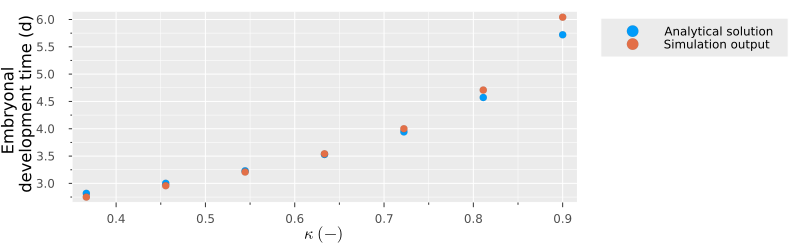

In [37]:
"""
Get simulated and analytically calculated age at bith, given values for kappa and v.
$(TYPEDSIGNATURES)
"""
function evaluate_a_b(kappa::Float64, v::Float64)
    flea_params = deepcopy(default_flea_params) 
    # smallest E_G_0 value that doesn't break the model (k_M becomes large as a result of this)
    flea_params[:kappa_0] = kappa
    flea_params[:v] = v

    out = life_table(default_global_params, phyto_params, flea_params; n_reps=1)
    L_b_sim, a_b_sim = @subset(out.repro, :t_day.==minimum(:t_day))[1,[:L, :age]]

    L_max_anl = L_max(flea_params[:kappa_0], flea_params[:p_A_m_0], flea_params[:p_M_V_0])
    g_anl = g(flea_params[:E_G_0], flea_params[:v], flea_params[:kappa_0], flea_params[:p_A_m_0])
    k_M_anl = k_M(flea_params[:p_M_V_0], flea_params[:E_G_0])
    a_b_anl = age_at_birth(L_b_sim, L_max_anl, k_M_anl, g_anl, 1.)
    return a_b_sim, a_b_anl
end

vec_a_b_sim = []
vec_a_b_anl = []
kappa_sim = []
for kappa in range(0.1, 0.9, length=10)
    try
        a_b_sim, a_b_anl = evaluate_a_b(kappa, default_flea_params[:v])
        push!(vec_a_b_sim, a_b_sim)
        push!(vec_a_b_anl, a_b_anl)
        push!(kappa_sim, kappa)
    catch
        nothing
    end
end
p = scatter(
    kappa_sim, vec_a_b_anl, 
    xlabel=L"\kappa\ (-)", ylabel="Embryonal \n development time (d)", 
    leg=:outertopright, label="Analytical solution", 
    size=(800,250), leftmargin=5mm, bottommargin=5mm
)
scatter!(kappa_sim, vec_a_b_sim, label="Simulation output")
savefig(plot(p, dpi=300), "figures/implementation_verification_embryonal_development_time.png")
p

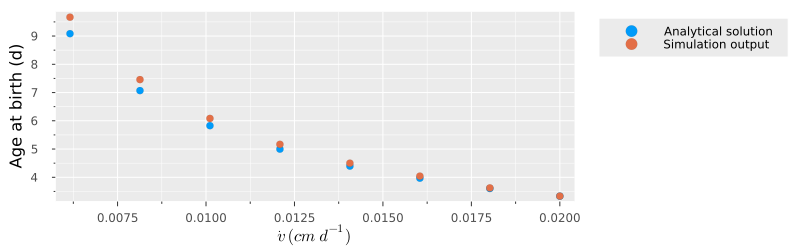

In [38]:
vec_a_b_sim = []
vec_a_b_anl = []
v_sim = []

for v in range(0.0022, 0.02, length=10)
    try
        a_b_sim, a_b_anl = evaluate_a_b(default_flea_params[:kappa_0], v)
        push!(vec_a_b_sim, a_b_sim)
        push!(vec_a_b_anl, a_b_anl)
        push!(v_sim, v)
    catch
        nothing
    end
end
scatter(
    v_sim, vec_a_b_anl, 
    xlabel=L"\dot{v}\ (cm\ d^{-1})", ylabel="Age at birth (d)", 
    leg=:outertopright, label="Analytical solution", 
    size=(800,250), leftmargin=5mm, bottommargin=5mm
)
scatter!(v_sim, vec_a_b_sim, label="Simulation output")

The simulation output follows the same pattern as the analytical solution. There is a consistent and very marginal difference in the absolute values of $a_b$. It is not entrirely clear what causes it, but the differences are probably small enough to be irrelevant, and occur for parameter combinations which are biologically irrelevant.\\
Note that the analytical solution is only valid under specific assumptions. 
When other (potentially realistic) input parameters are used, 
it is not guaranteed that the same level of agreement will be reached.

### Maximum length

Maximum length (at constant and abundant food) can be directly calculated from parameters:
$$
L_{max} = \kappa \frac{
\left\{  \dot{p}_{A,max} \right\}
}{
\left[ \dot{p}_M \right]
}
$$

To verify that $L_{max}$ is replicated correctly, we need to set assimilation efficiency constant and calculate it internally from maximum ingestion and assimilation rates.

In [39]:
flea_params = deepcopy(default_flea_params) 

flea_params[:kappa_EX_min] = flea_params[:kappa_EX_max] = flea_params[:p_A_m_0] / flea_params[:J_X_A_m_0]
flea_params[:cv] = 0.
global_params = deepcopy(default_global_params)
# increase t_max to be sure that the analytical L_max will be reached
global_params[:t_max] = 56;
# calculate L max analytically
L_max_anl = L_max(flea_params[:kappa_0], flea_params[:p_A_m_0], flea_params[:p_M_V_0])

0.054705986990994986

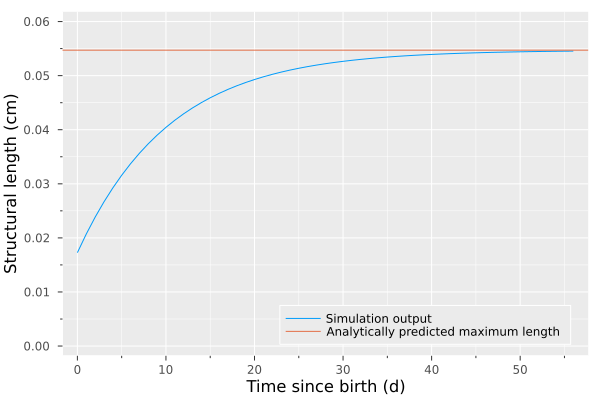

In [40]:
out = life_table(global_params, phyto_params, flea_params; n_reps=1)

p = @df out.growth plot(
    :t_day, :L, 
    xlabel="Time since birth (d)", ylabel="Structural length (cm)", 
    leg=:bottomright, label="Simulation output",
    ylim=(0, 0.06)
    )
hline!([L_max_anl], label="Analytically predicted maximum length")
savefig(plot(p, dpi=300), "figures/implementation_verification_maximum_length.png")
p

## Feeding

In [41]:
flea_params = deepcopy(default_flea_params) 
#flea_params[:kappa_EX_min] = flea_params[:kappa_EX_max] = flea_params[:p_A_m_0] / flea_params[:J_X_A_m_0]
flea_params[:cv] = 0.
flea_params[:e_50_adpt] = 0.75
flea_params[:beta_e_adpt] = 2.0
global_params = deepcopy(default_global_params)
global_params[:A_inoculate] = [0.1]
#global_params[:renew_medium] = [0, 2, 5]

1-element Vector{Float64}:
 0.1

In [42]:
out = life_table(global_params, phyto_params, flea_params; n_reps=1);

We simulated food being added daily, but never being removed by medium renewals. Since a single animal cannot ingest that much, food accumulates in the medium:

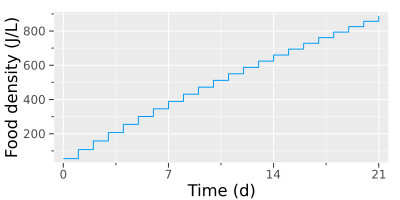

In [43]:
@df out.repro plot(
    plot(:t_day, :X_p , linetype=:steppost), size=(400, 200), xlabel="Time (d)", ylabel="Food density (J/L)",
    xticks=0:7:21
    )

We can use this output to check the shape of the scaled functional response, which should perfectly follow the Type II functional response equation. <br>
This can be compared with the functional response plotted on top:

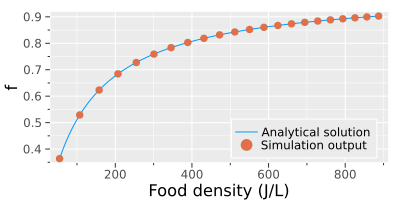

In [44]:
# calulating the functional response directly
xvals = range(extrema(out.repro.X_p)..., length=100)
f_anl = @. xvals / ((flea_params[:J_X_A_m_0]/flea_params[:F_m_0])+xvals)
# comparison with simulation output
   
plot(xvals, f_anl, xlabel="Food density (J/L)", ylabel="f", leg=:bottomright, label="Analytical solution", size=(400,200))
@df out.repro scatter!(:X_p, :f, label="Simulation output")

This shows that the functional response is implemented correctly, but it might be useful to check that the scaling by surface area is also correct.
We can effectively fix $f$ to a value of 1 by using a very high food density, then plot ingestion rate against surface area and should see a perfectly linear relationship:

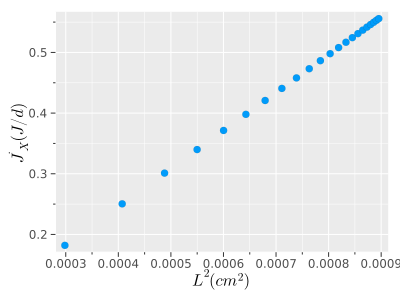

In [45]:
flea_params = deepcopy(default_flea_params) 
#flea_params[:kappa_EX_min] = flea_params[:kappa_EX_max] = flea_params[:p_A_m_0] / flea_params[:J_X_A_m_0]
flea_params[:cv] = 0.
global_params = deepcopy(default_global_params)
global_params[:A_inoculate] = [1000.]
out = life_table(global_params, phyto_params, flea_params; n_reps=1);
@df out.repro scatter(:L.^2, :J_X, xlabel=L"L^2 (cm^2)", ylabel=L"\dot{J_X} (J/d)", size=(400,300))

Lastly, we need to check that the external food density is updated correctly. We do so by calculating the differential along the vector of output food densities and comparing this with the output ingestion rate, which, in the absence of medium renewals, should be mirror images. <br>
They might not be perfectly reciprocal because neonates are only removed daily and will also ingest some food, but the difference should not exceed a few percent of the total change in food density. <br>
For this, we turn off daily addition of food, so food densities should decline continuously.

In [46]:
flea_params = deepcopy(default_flea_params) 
global_params = deepcopy(default_global_params)
global_params[:data_recording_interval] = 1/24
global_params[:A_inoculate] = [0.]
global_params[:A_0] = [0.4]
out = life_table(global_params, phyto_params, flea_params; n_reps=1);

┌ Warning: Inference of survival will currently fail for data_recording_interval !=1.
└ @ Main c:\Users\shansul\Documents\Research\COM-MET-MIX\WP2\TKTD_calibrations\TKTD_calibrations\src\Simulation.jl:97


In [47]:
dX = diffvec(out.repro.X_p) # change in external food concentration
JX = out.repro.J_X # ingestion rate
ratio = abs.(dX ./ JX) # ratio between both
extrema(ratio[2:end]) # show extrema of ratios, excluding first timepoint (=always 0)

(1.0239657417767893, 1.04331586949277)

## Adaptive plasticity

For adaptive plasticity, there are no analytical solutions that would be useful for implementation verification.<br>
We do a quick check that $\kappa$ increases with increasing $e$ and approaches $kappa_0$.

In [48]:
flea_params = deepcopy(default_flea_params) 
#flea_params[:kappa_EX_min] = flea_params[:kappa_EX_max] = flea_params[:p_A_m_0] / flea_params[:J_X_A_m_0]
flea_params[:cv] = 0.
flea_params[:e_50_adpt] = 0.5
flea_params[:beta_e_adpt] = 4.0
global_params = deepcopy(default_global_params)
global_params[:A_inoculate] = [0.1]
#global_params[:renew_medium] = [0, 2, 5]

1-element Vector{Float64}:
 0.1

In [49]:
out = life_table(global_params, phyto_params, flea_params; n_reps=1);

Note that it is not guaranteed that $\kappa_0$ will be reached. This depends on the value of $\beta_{e,adpt}$. <br>
$kappa_0$ (horizontal line) should however be approached as $e$ increases.

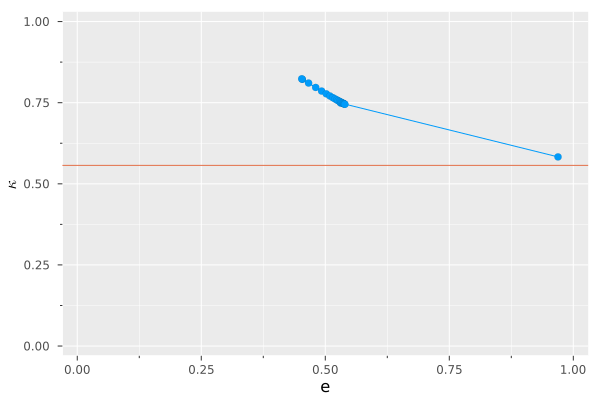

In [50]:
@df out.repro plot(:e, :kappa, xlim=(0,1), ylim=(0,1), label=L"\kappa_e", xlabel="e", ylabel=L"\kappa", marker=true)
hline!([flea_params[:kappa_0]], label=L"\kappa_0")

## Reproduction

Reproduction should occur in discrete intervals, dictated by the time between molts. Note that the plot below indicates reproduction at the time-points when neonates hatch (after embryonal development has been completed), **not** at the time-points of oviposition.

┌ Warning: Inference of survival will currently fail for data_recording_interval !=1.
└ @ Main c:\Users\shansul\Documents\Research\COM-MET-MIX\WP2\TKTD_calibrations\TKTD_calibrations\src\Simulation.jl:97


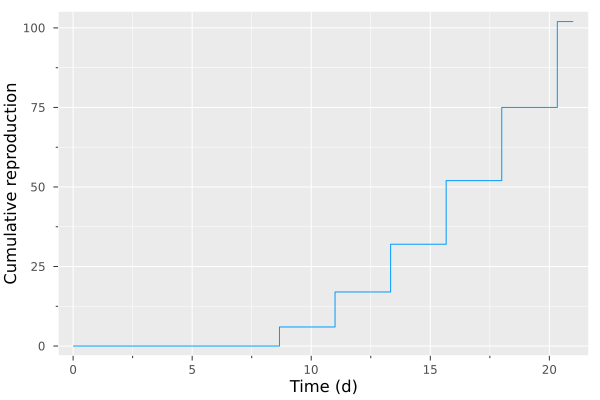

In [51]:
flea_params = deepcopy(default_fleas.DM_AMP) # use d magna parameters
flea_params[:kappa_EX_min] = flea_params[:kappa_EX_max] = 1. #flea_params[:p_A_m_0] / flea_params[:J_X_A_m_0]
flea_params[:cv] = 0.
global_params = deepcopy(default_global_params)
global_params[:A_inoculate] = [0.4]
global_params[:data_recording_interval] = 1/24
out = life_table(global_params, phyto_params, flea_params; n_reps=1);
@df out.repro plot(:t_day, :cum_repro, linetype=:steppost, xlabel="Time (d)", ylabel="Cumulative reproduction", leg=false)

If we increase $\tau_{molt}$, reproduction should occur less frequently. ($t_{max}$ is increased to demonstrate this). <br>
Note that the values used below are not biologically realistic for *Daphnia*, but only 
used to demonstrate that increase of the molting period has the expected effect

┌ Warning: Inference of survival will currently fail for data_recording_interval !=1.
└ @ Main c:\Users\shansul\Documents\Research\COM-MET-MIX\WP2\TKTD_calibrations\TKTD_calibrations\src\Simulation.jl:97


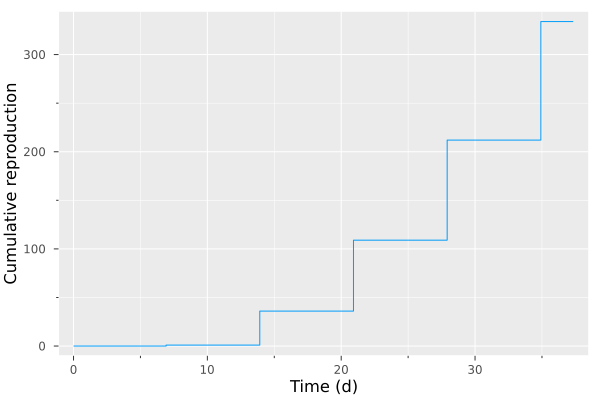

In [53]:
flea_params = deepcopy(default_fleas.DM_AMP) # use d magna parameters
flea_params[:kappa_EX_min] = flea_params[:kappa_EX_max] = 1. #flea_params[:p_A_m_0] / flea_params[:J_X_A_m_0]
flea_params[:cv] = 0.
flea_params[:tau_molt] = 7
flea_params[:h_a] = 0.
global_params = deepcopy(default_global_params)
global_params[:A_inoculate] = [0.4]
global_params[:data_recording_interval] = 1/24
global_params[:t_max] = 56
out = life_table(global_params, phyto_params, flea_params; n_reps=1);
@df out.repro plot(:t_day, :cum_repro, linetype=:steppost, xlabel="Time (d)", ylabel="Cumulative reproduction")

The energy in the reproduction buffer should increase continously during adulthood, and decrease in a discrete manner.

┌ Warning: Inference of survival will currently fail for data_recording_interval !=1.
└ @ Main c:\Users\shansul\Documents\Research\COM-MET-MIX\WP2\TKTD_calibrations\TKTD_calibrations\src\Simulation.jl:97


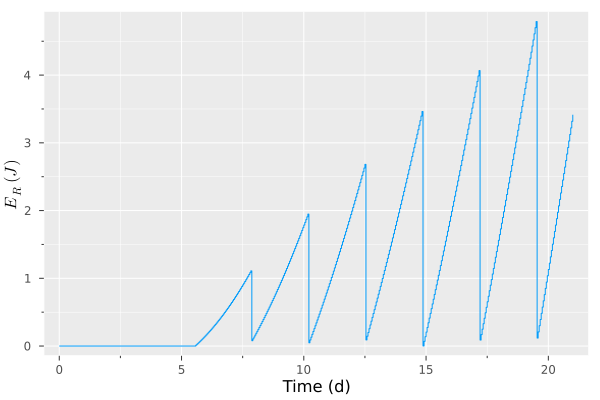

In [54]:
flea_params = deepcopy(default_fleas.DM_AMP) # use d magna parameters
flea_params[:kappa_EX_min] = flea_params[:kappa_EX_max] = 1. #flea_params[:p_A_m_0] / flea_params[:J_X_A_m_0]
flea_params[:cv] = 0.
global_params = deepcopy(default_global_params)
global_params[:A_inoculate] = [0.4]
global_params[:data_recording_interval] = 1/24
out = life_table(global_params, phyto_params, flea_params; n_reps=1)
@df out.repro plot(:t_day, :E_R, linetype=:steppost, xlabel="Time (d)", ylabel=L"E_R\ (J)")

## Starvation mortality

Survival is simulated at two food levels for three different values of the starvation parameter $\beta_e$.

In [60]:
flea_params = deepcopy(default_flea_params) 
#flea_params[:kappa_EX_min] = flea_params[:kappa_EX_max] = flea_params[:p_A_m_0] / flea_params[:J_X_A_m_0]
flea_params[:cv] = 0.
global_params = deepcopy(default_global_params)
global_params[:data_recording_interval] = 1.
global_params[:A_inoculate] = [0.]
global_params[:A_0] = [0.4]
global_params[:t_max] = 56

outs = LifeTableDataset[]
e_starve_sweep = [0.125, 0.25, 0.5]
for e_starve in e_starve_sweep
    for A_0 in [0.1, 0.4]
        global_params[:A_0] = [A_0]
        flea_params[:e_starve] = e_starve
        flea_params[:beta_e] = 0.5
        out = life_table(global_params, phyto_params, flea_params; n_reps=10)
        out.survival[!,:e_starve] .= e_starve
        out.survival.food_level .= A_0
        push!(outs, out)
    end
end
out = concat(outs)
typeof(out)

LifeTableDataset

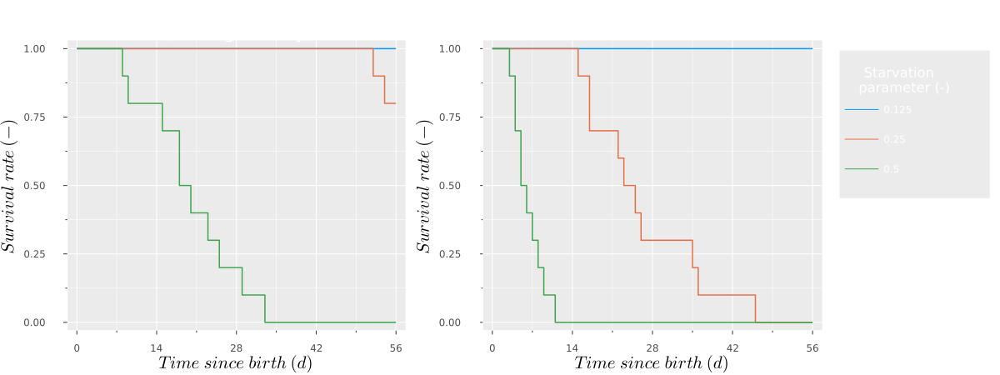

In [63]:
plot(
    (@df @subset(out.survival, :food_level.==0.4) plot(
        :t_day, :survival, group=:e_starve, linetype=:steppost,
        xlabel=L"Time\ since\ birth\ (d)", ylabel=L"Survival\ rate\ (-)", 
        legend=false,
        leftmargin=5mm, bottommargin=5mm, xticks=0:14:56, title="High food \n (0.4 mg dm/day)"
        )),
    (@df @subset(out.survival, :food_level.==0.1) plot(
        :t_day, :survival, group=:e_starve, linetype=:steppost,
        xlabel=L"Time\ since\ birth\ (d)", ylabel=L"Survival\ rate\ (-)", 
        legend_title="Starvation \n parameter (-)", 
        leftmargin=5mm, bottommargin=5mm, xticks=0:14:56, title="Low food \n (0.1 mg dm/day)",
        titlefontsize=12, legend=:outertopright
        )), 
        lw=1.5, background=:transparent, labelfontsize=14, layout=@layout([a{0.4w} b{0.6w}]),
        size=(1200,450), topmargin=5mm, ylim=(0,1)
)

In [64]:
flea_params = deepcopy(default_flea_params) 
#flea_params[:kappa_EX_min] = flea_params[:kappa_EX_max] = flea_params[:p_A_m_0] / flea_params[:J_X_A_m_0]
flea_params[:cv] = 0.
flea_params[:e_starve] = 0.25

global_params = deepcopy(default_global_params)
global_params[:data_recording_interval] = 1.
global_params[:A_inoculate] = [0.]
global_params[:A_0] = [0.1]
global_params[:t_max] = 56

outs = LifeTableDataset[]
beta_e_sweep = [0.01, 0.1, 2.0]
for beta_e in beta_e_sweep
    flea_params[:beta_e] = beta_e
    out = life_table(global_params, phyto_params, flea_params; n_reps=10)
    out.survival.beta_e .= beta_e
    push!(outs, out)
end
out = concat(outs)
typeof(out)

LifeTableDataset

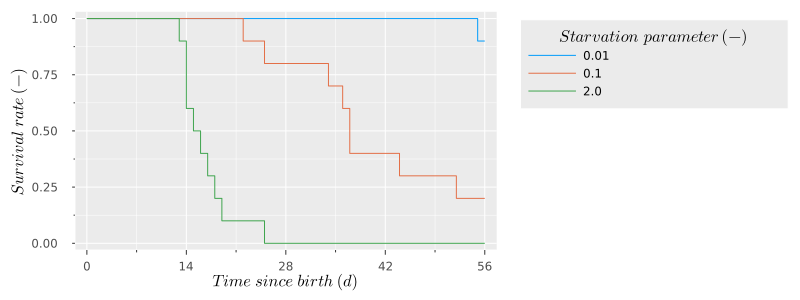

In [65]:
@df out.survival plot(
    :t_day, :survival, group=:beta_e, 
    legend=:outertopright, linetype=:steppost,
    xlabel=L"Time\ since\ birth\ (d)", ylabel=L"Survival\ rate\ (-)", 
    legend_title=L"Starvation\ parameter\ (-)", size=(800,300),
    leftmargin=5mm, bottommargin=5mm, xticks=0:14:56
)

## Ageing

The ageing submodel is checked for plausability by altering the ageing acceleration $\ddot{h}_a$ and comparing survival rates.

In [66]:
flea_params = deepcopy(default_flea_params) 
#flea_params[:kappa_EX_min] = flea_params[:kappa_EX_max] = flea_params[:p_A_m_0] / flea_params[:J_X_A_m_0]
flea_params[:cv] = 0.
global_params = deepcopy(default_global_params)
global_params[:data_recording_interval] = 1.
global_params[:A_inoculate] = [0.]
global_params[:A_0] = [0.4]
global_params[:t_max] = 56

outs = LifeTableDataset[]
h_a_sweep = [0, 1e-5, 1e-4, 1e-3, 1e-2, 1e-1]
for h_a in h_a_sweep
    flea_params[:h_a_accel] = h_a
    out = life_table(global_params, phyto_params, flea_params; n_reps=10)
    out.survival.h_a .= h_a
    push!(outs, out)
end
out = concat(outs)
typeof(out)

LifeTableDataset

As we would expect, high values for $\ddot{h}_a$ cause individuals to die from ageing at a youger age.

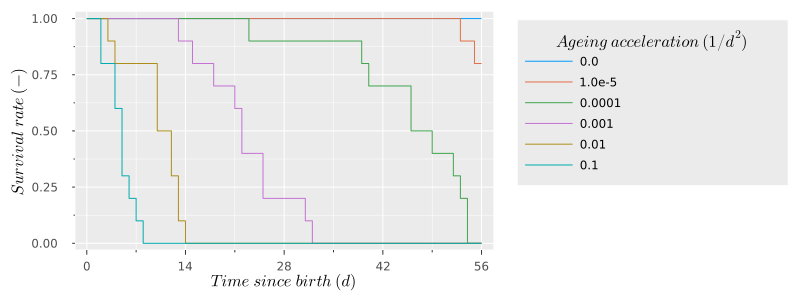

In [67]:
@df out.survival plot(
    :t_day, :survival, group=:h_a, 
    legend=:outertopright, linetype=:steppost,
    xlabel=L"Time\ since\ birth\ (d)", ylabel=L"Survival\ rate\ (-)", 
    legend_title=L"Ageing\ acceleration\ (1/d^2)", size=(800,300),
    leftmargin=5mm, bottommargin=5mm, xticks=0:14:56
)

## TKTD

### Toxicokinetics

TK is controlled by a single parameter $\dot{k}_d$. 
The TK module is checked for plausibility by turning off TD (setting all parameters to 0.) and only simulating TK. <br>
Comparison with analytical solutions is possible, but currently considered too time-intesive for the purpose of validating this implementation.

The plot below shows that, for a $k_d$ value of 1 $d^{-1}$, the substance is taken up very fast.

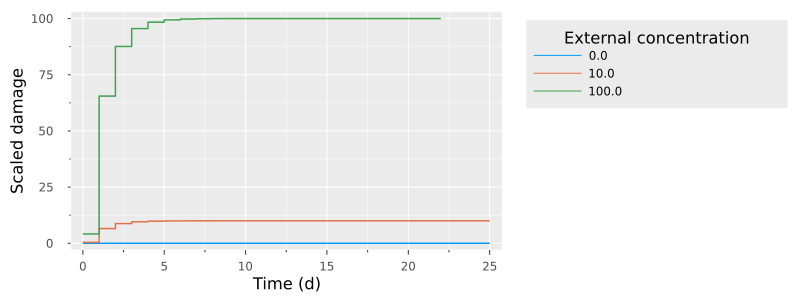

In [68]:
global_params = deepcopy(default_global_params)
global_params[:data_recording_interval] = 1.
global_params[:A_inoculate] = [0.]
global_params[:A_0] = [0.4]
global_params[:t_max] = 56.

flea_params = deepcopy(default_fleas.DM_AMP) 
#flea_params[:kappa_EX_min] = flea_params[:kappa_EX_max] = flea_params[:p_A_m_0] / flea_params[:J_X_A_m_0]
flea_params[:cv] = 0.
flea_params[:TKTD][1].TK[1].params = [1.]

outs = LifeTableDataset[]
C_sweep = [0., 10., 100.]
for C in C_sweep
    global_params[:C][1] = C
    out = life_table(global_params, phyto_params, flea_params; n_reps=10)
    out.repro.C .= C
    out.growth.C .= C
    out.survival.C .= C
    push!(outs, out)
end
out = concat(outs)
sort!(out.repro, :t_day)
@df out.repro plot(:t_day, [c[1] for c in :C_int_1], group=:C, linetype=:steppost, leg=:outertopright, 
    xlabel="Time (d)", ylabel="Scaled damage", legend_title="External concentration",
    size=(800,300), bottommargin=5mm, leftmargin=5mm, lw=1.5
)

Lowering $k_d$ to 0.1 leads, expectedly, to a more gradual uptake.

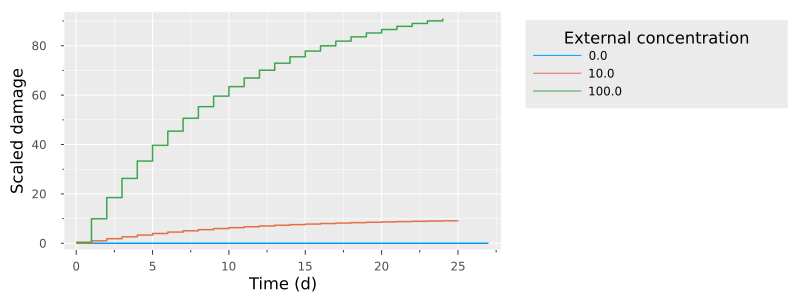

In [69]:
flea_params[:TKTD][1].TK[1].params = [.1]

outs = LifeTableDataset[]
C_sweep = [0., 10., 100.]
for C in C_sweep
    global_params[:C][1] = C
    out = life_table(global_params, phyto_params, flea_params; n_reps=10)
    out.repro.C .= C
    out.growth.C .= C
    out.survival.C .= C
    push!(outs, out)
end
out = concat(outs)
sort!(out.repro, :t_day)
@df out.repro plot(:t_day, [c[1] for c in :C_int_1], group=:C, linetype=:steppost, leg=:outertopright, 
    xlabel="Time (d)", ylabel="Scaled damage", legend_title="External concentration",
    size=(800,300), bottommargin=5mm, leftmargin=5mm, lw=1.5
)

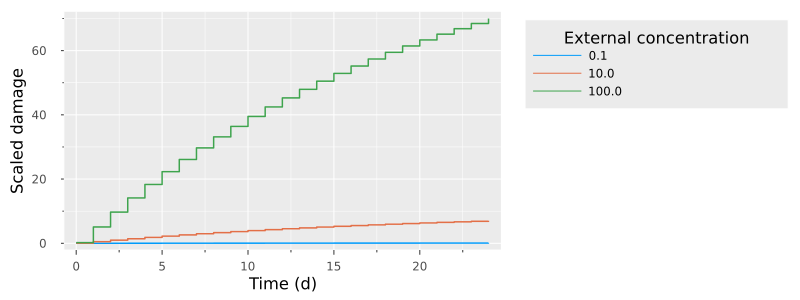

In [70]:
flea_params[:TKTD][1].TK[1].params = [.05]
outs = LifeTableDataset[]
C_sweep = [0.1, 10., 100.]
for C in C_sweep
    global_params[:C][1] = C
    out = life_table(global_params, phyto_params, flea_params; n_reps=10)
    out.repro.C .= C
    out.growth.C .= C
    out.survival.C .= C
    push!(outs, out)
end
out = concat(outs)
sort!(out.repro, :t_day)
@df out.repro plot(:t_day, [c[1] for c in :C_int_1], group=:C, leg=:outertopright, 
    xlabel="Time (d)", ylabel="Scaled damage", legend_title="External concentration",
    size=(800,300), bottommargin=5mm, leftmargin=5mm, lw=1.5, linetype=:steppost
)

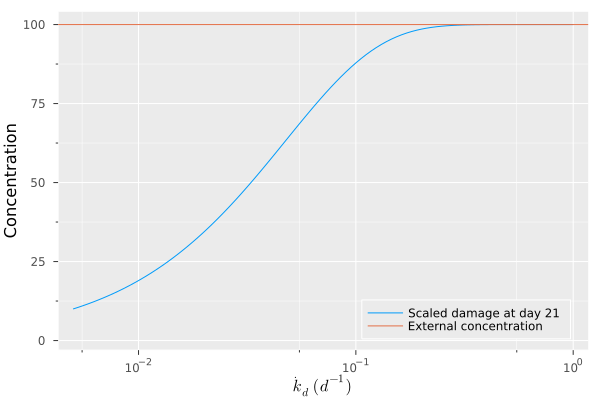

In [71]:
outs = LifeTableDataset[]
kd_sweep = 10 .^ range(log10(0.005), log10.(1), length=100)
for k_d in kd_sweep
    global_params[:C][1] = 100.
    flea_params[:TKTD][1].TK[1].params = [k_d]
    out = life_table(global_params, phyto_params, flea_params; n_reps=10)
    out.repro.k_d .= k_d
    push!(outs, out)
end
out = concat(outs)
sort!(out.repro, :t_day)
@df @subset(out.repro, round.(:t_day, sigdigits=2).==21) plot(:k_d, [c[1] for c in :C_int_1], xscale=:log10, ylim=(0,101),
    xlabel=L"\dot{k}_d\ (d^{-1})", ylabel="Concentration", label="Scaled damage at day 21"
)
hline!([100.], leg=:bottomright, label="External concentration")

#### Linking/unlinking of TK models

TK models can be linked for different PMoAs, or independent of each other. <br>
When `link_TK=true`, the damage values for all PMoAs should be identical.

In [72]:
flea_params[:TKTD][1].TK[1].params = [.05]
flea_params[:TKTD][1].link_TK = true
outs = LifeTableDataset[]
C_sweep = [0.1, 10., 100.]
for C in C_sweep
    global_params[:C][1] = C
    out = life_table(global_params, phyto_params, flea_params; n_reps=10)
    out.repro.C .= C
    out.growth.C .= C
    out.survival.C .= C
    push!(outs, out)
end
out = concat(outs)
sort!(out.repro, :t_day)
# matrix of damage values per TK component
damage_matrix = vcat(out.repro.C_int_1...)
# this statement needs to be true
damage_matrix[:,1]==damage_matrix[:,2]==damage_matrix[:,3]==damage_matrix[:,4]==damage_matrix[:,5]

true

When `link=false`, damage dynamics are different for every PMoA.

In [73]:
flea_params[:TKTD][CU].TK[1].params = [.05]
flea_params[:TKTD][CU].TK[2].params = [1.0]
flea_params[:TKTD][CU].TK[3].params = [0.]
flea_params[:TKTD][CU].link_TK = false
outs = LifeTableDataset[]
C_sweep = [0.1, 10., 100.]
for C in C_sweep
    global_params[:C][1] = C
    out = life_table(global_params, phyto_params, flea_params; n_reps=10)
    out.repro.C .= C
    out.growth.C .= C
    out.survival.C .= C
    push!(outs, out)
end
out = concat(outs)
sort!(out.repro, :t_day);

The figure below should show slow TK for TK component 1, fast TK for TK component 2, and no increase in damage for TK component 3.

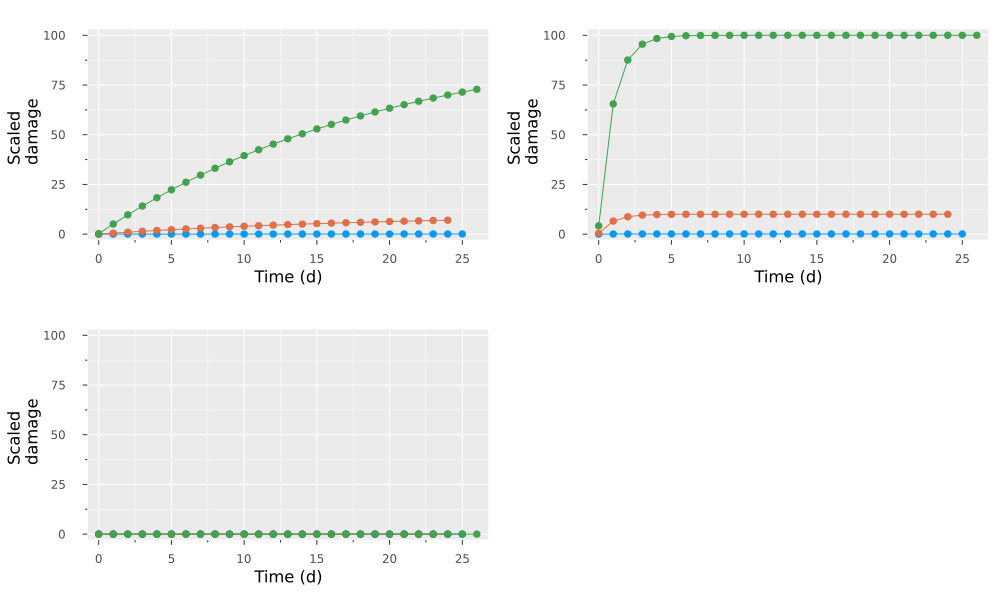

In [74]:
@df out.repro plot(
    groupedlineplot(:t_day, [c[1] for c in :C_int_1], :C, marker=true, title="TK component 1", ylim=(0,100)),
    groupedlineplot(:t_day, [c[2] for c in :C_int_1], :C, marker=true, title="TK component 2"),
    groupedlineplot(:t_day, [c[3] for c in :C_int_1], :C, marker=true, title="TK component 3", ylim=(0,100)),
    xlabel="Time (d)", ylabel="Scaled \n damage", bottommargin=5mm, leftmargin=5mm, size=(1000,600),
    background_color=:transparent
)

### Toxicodynamics

For the TD module, we first check for the presence/absence of effects on reproduction, growth and survival for each mode of action. Reproduction should be affect by all modes of action. Growth should be affected by all by reproduction efficiency. Maintenance costs and Assimilation efficiency should affect survival by triggering starvation mortality

#### Growth costs

Top row shows carapace length (cm) over time, bottom row cumulative reproduction. Each column is an exposure concentration.

In [75]:
outs = LifeTableDataset[]
for C in C_sweep
    global_params[:C][CU] = C
    out = life_table(global_params, phyto_params, flea_params; n_reps=10)
    out.repro[!,:C] .= C
    out.growth[!,:C] .= C
    out.survival[!,:C] .= C
    push!(outs, out)
end

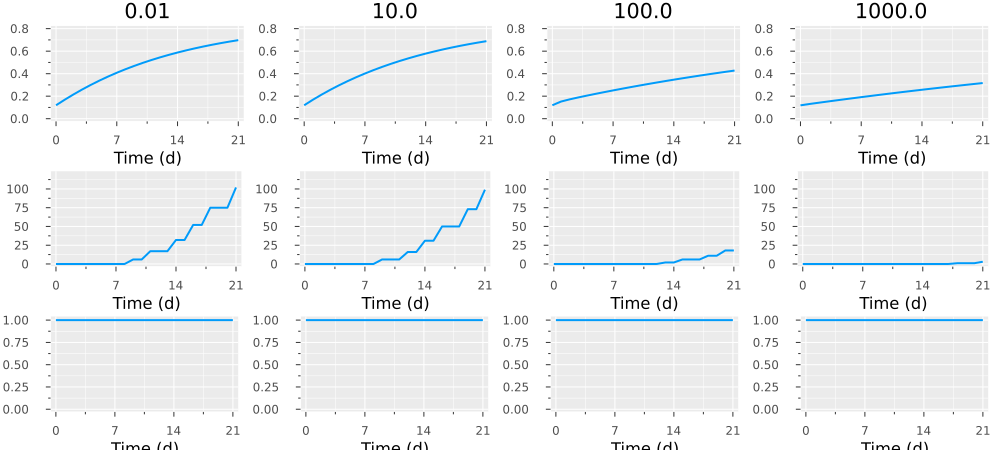

In [76]:
global_params = deepcopy(default_global_params)
global_params[:data_recording_interval] = 1.
global_params[:A_inoculate] = [0.4]

flea_params = deepcopy(default_fleas.DM_AMP) 
flea_params[:kappa_EX_min] = flea_params[:kappa_EX_max] = 1. #flea_params[:p_A_m_0] / flea_params[:J_X_A_m_0]
flea_params[:cv] = 0.
flea_params[:h_a_accel] = 0.
flea_params[:beta_e] = 0.
flea_params[:TKTD][CU].TD = default_flea_params[:TKTD][1].TD[[G]]
flea_params[:TKTD][CU].TD[1].DRC.params = (100., 2., 5.)
flea_params[:TKTD][CU].TK[1].params = [1.]
flea_params[:TKTD][CU].link_TK = true
outs = LifeTableDataset[]
C_sweep = [0.01, 10., 100., 1000.]
for C in C_sweep
    global_params[:C][CU] = C
    out = life_table(global_params, phyto_params, flea_params; n_reps=10)
    out.repro[!,:C] .= C
    out.growth[!,:C] .= C
    out.survival[!,:C] .= C
    push!(outs, out)
end
out = concat(outs)

sort!(out.growth, :t_day)
sort!(out.repro, :t_day)
pg = @df out.growth plot(
    :t_day, :carapace_length, group=:C, 
    ylim=(0,0.8), layout=(1,4), title=hcat(C_sweep...), 
    size=(800,300), lw=1.5
)
pr = @df out.repro plot(:t_day, :cum_repro, group=:C, layout=(1,4), ylim=(0,120))
ps = @df out.survival plot(:t_day, :survival, group=:C, layout=(1,4), ylim=(0,1.01))
plot(pg, pr, ps, layout=(3,1), xticks=0:7:21, xlabel="Time (d)", lw=2, size=(1000, 450))

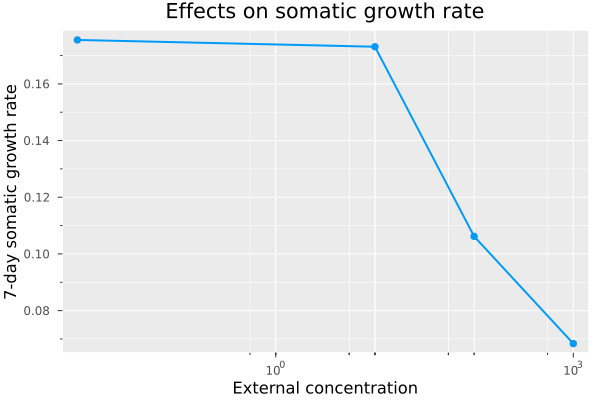

In [77]:
combine(groupby(out.growth, :C)) do df
    L0 = df.carapace_length[1]
    L7 = df[argmin(abs.(df.t_day .- 7)),:carapace_length]
    return DataFrame(
        SGR = (log(L7)-log(L0))/7
    )
end |> x-> plot(x.C, x.SGR, xlabel="External concentration", ylabel="7-day somatic growth rate", xscale=:log10, lw=2, title="Effects on somatic growth rate", marker=true)

#### Maintenance costs

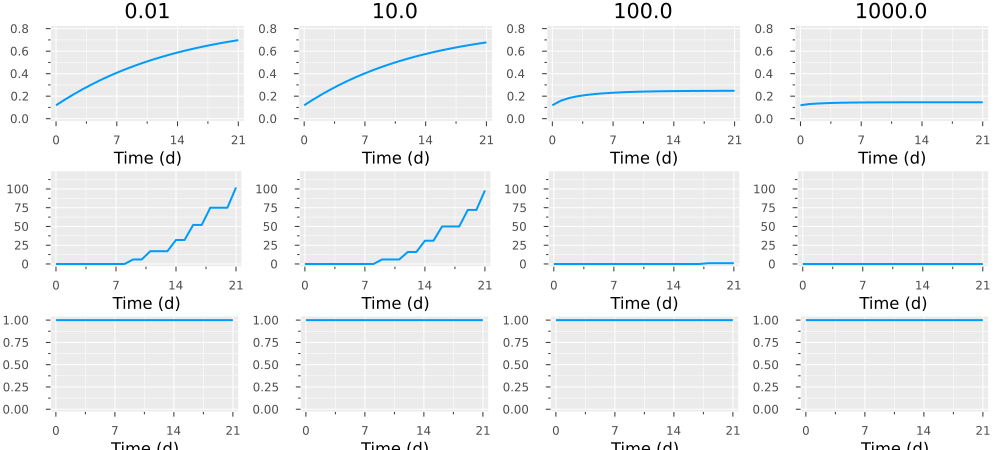

In [78]:
global_params = deepcopy(default_global_params)
global_params[:data_recording_interval] = 1.
global_params[:A_inoculate] = [0.4]

flea_params = deepcopy(default_fleas.DM_AMP) 
flea_params[:kappa_EX_min] = flea_params[:kappa_EX_max] = 1. #flea_params[:p_A_m_0] / flea_params[:J_X_A_m_0]
flea_params[:cv] = 0.
flea_params[:h_a_accel] = 0.
flea_params[:beta_e] = 0.0
flea_params[:TKTD][CU].TD = default_flea_params[:TKTD][1].TD[[M]]
flea_params[:TKTD][CU].TD[1].DRC.params = (100., 2., 5.)
flea_params[:TKTD][CU].TK[1].params = [1.]
flea_params[:TKTD][CU].link_TK = true

outs = LifeTableDataset[]
C_sweep = [0.01, 10., 100., 1000.]
for C in C_sweep
    global_params[:C][1] = C
    out = life_table(global_params, phyto_params, flea_params; n_reps=10)
    out.repro.C .= C
    out.growth.C .= C
    out.survival.C .= C
    push!(outs, out)
end
out = concat(outs)

sort!(out.growth, :t_day)
sort!(out.repro, :t_day)
pg = @df out.growth plot(
    :t_day, :carapace_length, group=:C, 
    ylim=(0,0.8), layout=(1,4), title=hcat(C_sweep...), 
    size=(800,300), lw=1.5
)
pr = @df out.repro plot(:t_day, :cum_repro, group=:C, layout=(1,4), ylim=(0,120))
ps = @df out.survival plot(:t_day, :survival, group=:C, layout=(1,4), ylim=(0,1.01))
plot(pg, pr, ps, layout=(3,1), xticks=0:7:21, xlabel="Time (d)", lw=2, size=(1000, 450))

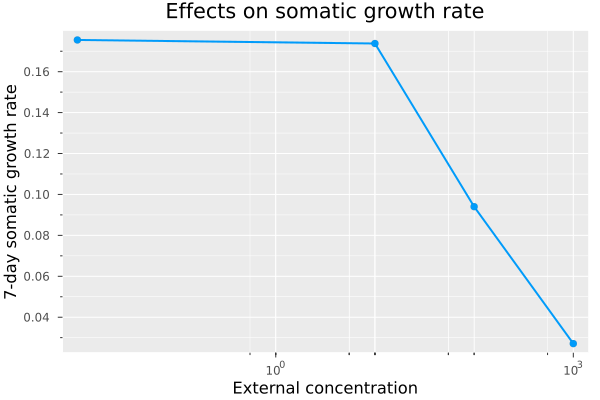

In [79]:
combine(groupby(out.growth, :C)) do df
    L0 = df.carapace_length[1]
    L7 = df[argmin(abs.(df.t_day .- 7)),:carapace_length]
    return DataFrame(
        SGR = (log(L7)-log(L0))/7
    )
end |> x-> plot(x.C, x.SGR, xlabel="External concentration", ylabel="7-day somatic growth rate", xscale=:log10, lw=2, title="Effects on somatic growth rate", marker=true)

#### Assimilation efficiency

Assimilation efficiency causes effects on all variables, including survival if $\dot{h}_{s,e}$ is large enough.

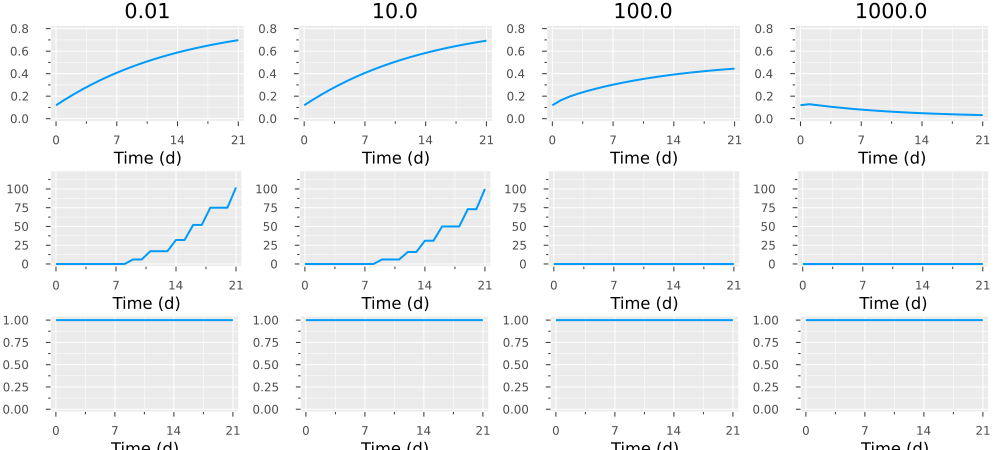

In [80]:
global_params = deepcopy(default_global_params)
global_params[:data_recording_interval] = 1.
global_params[:A_inoculate] = [0.4]

flea_params = deepcopy(default_fleas.DM_AMP) 
flea_params[:kappa_EX_min] = flea_params[:kappa_EX_max] = 1. #flea_params[:p_A_m_0] / flea_params[:J_X_A_m_0]
flea_params[:cv] = 0.
flea_params[:h_a_accel] = 0.
flea_params[:beta_e] = 0.1
flea_params[:TKTD][CU].TK[1].params = [1.]
flea_params[:TKTD][CU].link_TK = true

flea_params[:TKTD][CU].TD[A].DRC.params = (100., 2., 1.)

outs = LifeTableDataset[]
C_sweep = [0.01, 10., 100., 1000.]
for C in C_sweep
    global_params[:C][1] = C
    out = life_table(global_params, phyto_params, flea_params; n_reps=10)
    out.repro.C .= C
    out.growth.C .= C
    out.survival.C .= C
    push!(outs, out)
end
out = concat(outs)

sort!(out.growth, :t_day)
sort!(out.repro, :t_day)
pg = @df out.growth plot(
    :t_day, :carapace_length, group=:C, 
    ylim=(0,0.8), layout=(1,4), title=hcat(C_sweep...), 
    size=(800,300), lw=1.5
)
pr = @df out.repro plot(:t_day, :cum_repro, group=:C, layout=(1,4), ylim=(0,120))
ps = @df out.survival plot(:t_day, :survival, group=:C, layout=(1,4), ylim=(0,1.01))
plot(pg, pr, ps, layout=(3,1), xticks=0:7:21, xlabel="Time (d)", lw=2, size=(1000, 450))

#### Reproduction efficiency

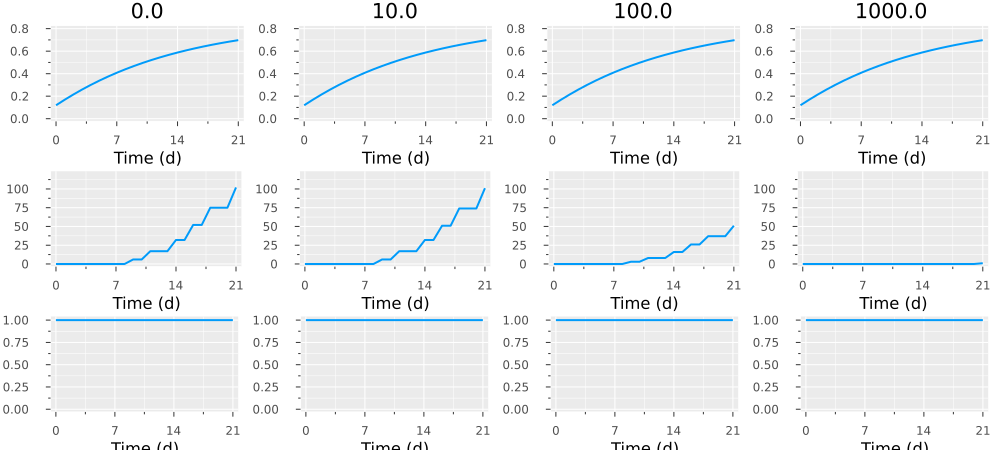

In [81]:
global_params = deepcopy(default_global_params)
global_params[:data_recording_interval] = 1.
global_params[:A_inoculate] = [0.4]

flea_params = deepcopy(default_fleas.DM_AMP) 
flea_params[:kappa_EX_min] = flea_params[:kappa_EX_max] = 1. #flea_params[:p_A_m_0] / flea_params[:J_X_A_m_0]
flea_params[:cv] = 0.
flea_params[:h_a_accel] = 0.
flea_params[:beta_e] = 0.1
flea_params[:TKTD][CU].TK[1].params = [1.]
flea_params[:TKTD][CU].link_TK = true
flea_params[:TKTD][CU].TD[R].DRC.params = (100., 2., 1.)

outs = LifeTableDataset[]
C_sweep = [0., 10., 100., 1000.]
for C in C_sweep
    global_params[:C][1] = C
    out = life_table(global_params, phyto_params, flea_params; n_reps=10)
    out.repro.C .= C
    out.growth.C .= C
    out.survival.C .= C
    push!(outs, out)
end
out = concat(outs)

sort!(out.growth, :t_day)
sort!(out.repro, :t_day)
pg = @df out.growth plot(
    :t_day, :carapace_length, group=:C, 
    ylim=(0,0.8), layout=(1,4), title=hcat(C_sweep...), 
    size=(800,300), lw=1.5
)
pr = @df out.repro plot(:t_day, :cum_repro, group=:C, layout=(1,4), ylim=(0,120))
ps = @df out.survival plot(:t_day, :survival, group=:C, layout=(1,4), ylim=(0,1.01))
plot(pg, pr, ps, layout=(3,1), xticks=0:7:21, xlabel="Time (d)", lw=2, size=(1000, 450))

Same for slow TK to check that the connection between TK and TD works as desired.

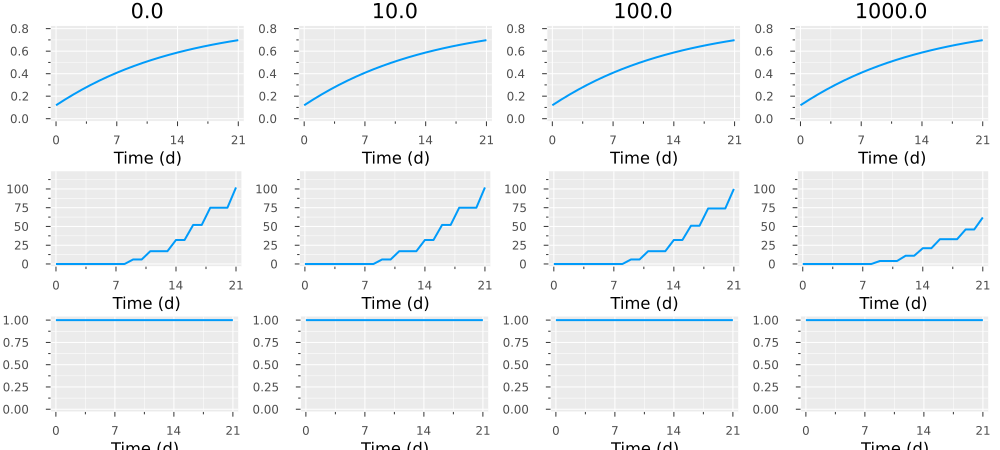

In [82]:
global_params = deepcopy(default_global_params)
global_params[:data_recording_interval] = 1.
global_params[:A_inoculate] = [0.4]

flea_params = deepcopy(default_fleas.DM_AMP) 
flea_params[:kappa_EX_min] = flea_params[:kappa_EX_max] = 1. #flea_params[:p_A_m_0] / flea_params[:J_X_A_m_0]
flea_params[:cv] = 0.
flea_params[:h_a_accel] = 0.
flea_params[:beta_e] = 0.1
flea_params[:TKTD][CU].TK[1].params = [.01]
flea_params[:TKTD][CU].link_TK = true
flea_params[:TKTD][CU].TD[EO].DRC = DRCModel(
    LL3GM,
    (100., 2., 1.)
)

outs = LifeTableDataset[]
C_sweep = [0., 10., 100., 1000.]
for C in C_sweep
    global_params[:C][1] = C
    out = life_table(global_params, phyto_params, flea_params; n_reps=10)
    out.repro.C .= C
    out.growth.C .= C
    out.survival.C .= C
    push!(outs, out)
end
out = concat(outs)

sort!(out.growth, :t_day)
sort!(out.repro, :t_day)
pg = @df out.growth plot(
    :t_day, :carapace_length, group=:C, 
    ylim=(0,0.8), layout=(1,4), title=hcat(C_sweep...), 
    size=(800,300), lw=1.5
)
pr = @df out.repro plot(:t_day, :cum_repro, group=:C, layout=(1,4), ylim=(0,120))
ps = @df out.survival plot(:t_day, :survival, group=:C, layout=(1,4), ylim=(0,1.01))
plot(pg, pr, ps, layout=(3,1), xticks=0:7:21, xlabel="Time (d)", lw=2, size=(1000, 450))

#### Somatic investment ratio

Increase in $\kappa$ should result in increased growth including maximum length and decreased reproduction.

In [83]:
default(leg=false)

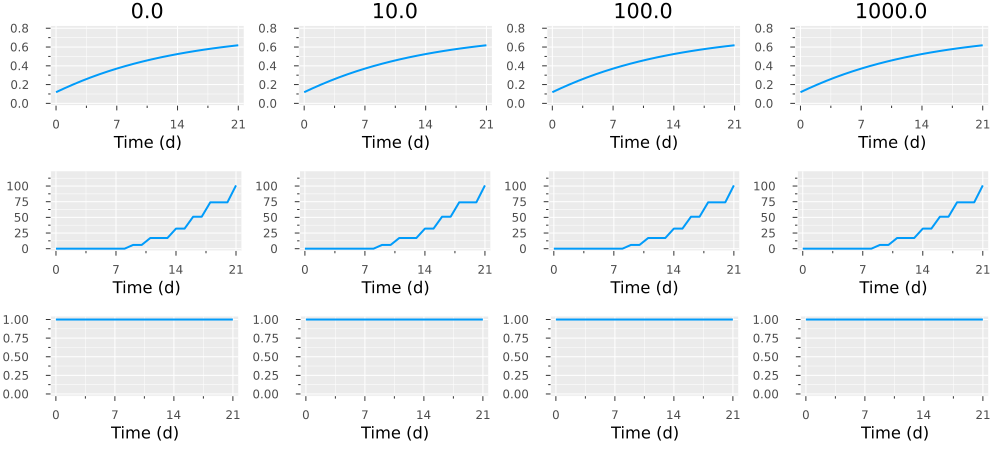

In [84]:
global_params = deepcopy(default_global_params)
global_params[:data_recording_interval] = 1.
global_params[:A_inoculate] = [0.4]

flea_params = deepcopy(default_fleas.DM_AMP) 
flea_params[:kappa_EX_min] = flea_params[:kappa_EX_max] = 1. #flea_params[:p_A_m_0] / flea_params[:J_X_A_m_0]
flea_params[:cv] = 0.
flea_params[:h_a_accel] = 0.
flea_params[:beta_e] = 0.1
flea_params[:e_50_adpt] = 1e-3
flea_params[:beta_e_adpt] = 10.
flea_params[:TKTD][CU].TK[KP].params = [1.]
flea_params[:TKTD][CU].link_TK = true
flea_params[:TKTD][CU].TD[KP].DRC = DRCModel(
    LL3GM,
    (100., 2., 1.)
)

outs = LifeTableDataset[]
C_sweep = [0., 10., 100., 1000.]
for C in C_sweep
    global_params[:C][1] = C
    out = life_table(global_params, phyto_params, flea_params; n_reps=10)
    out.repro.C .= C
    out.growth.C .= C
    out.survival.C .= C
    push!(outs, out)
end
out = concat(outs)

sort!(out.growth, :t_day)
sort!(out.repro, :t_day)
pg = @df out.growth plot(
    :t_day, :carapace_length, group=:C, 
    ylim=(0,0.8), layout=(1,4), title=hcat(C_sweep...), 
    size=(800,300), lw=1.5
)
pr = @df out.repro plot(:t_day, :cum_repro, group=:C, layout=(1,4), ylim=(0,120))
ps = @df out.survival plot(:t_day, :survival, group=:C, layout=(1,4), ylim=(0,1.01))
plot(pg, pr, ps, layout=(3,1), xticks=0:7:21, xlabel="Time (d)", lw=2, size=(1000, 450), bottommargin=5mm)

Decrease in $\kappa$ should result in decreased growth and (slightly) increased reproduction. <br>
The stimulating effect on reproduction should be relatively subtle compared to the stimulating effect on growth resulting from increased $\kappa$, 
because it implies a gross decrease in growth, therefore a gross decrease in reproduction, as well as a gross increase in reproduction. 
The parameter combination below should lead to a net decrease in reproduction.

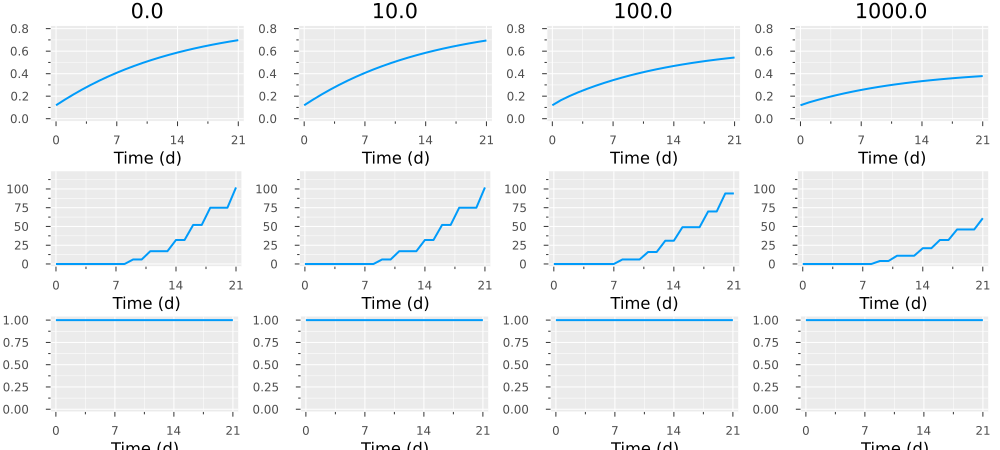

In [85]:
global_params = deepcopy(default_global_params)
global_params[:data_recording_interval] = 1.
global_params[:A_inoculate] = [0.4]

flea_params = deepcopy(default_fleas.DM_AMP) 
flea_params[:kappa_EX_min] = flea_params[:kappa_EX_max] = 1. #flea_params[:p_A_m_0] / flea_params[:J_X_A_m_0]
flea_params[:cv] = 0.
flea_params[:h_a_accel] = 0.
flea_params[:beta_e] = 0.1
flea_params[:TKTD][CU].TK[1].params = [1.]
flea_params[:TKTD][CU].link_TK = true
flea_params[:TKTD][CU].TD[KP].DRC = DRCModel(
    LL3GM,
    (100., 2., -.5)
)

outs = LifeTableDataset[]
C_sweep = [0., 10., 100., 1000.]
for C in C_sweep
    global_params[:C][1] = C
    out = life_table(global_params, phyto_params, flea_params; n_reps=10)
    out.repro.C .= C
    out.growth.C .= C
    out.survival.C .= C
    push!(outs, out)
end
out = concat(outs)

sort!(out.growth, :t_day)
sort!(out.repro, :t_day)
pg = @df out.growth plot(
    :t_day, :carapace_length, group=:C, 
    ylim=(0,0.8), layout=(1,4), title=hcat(C_sweep...), 
    size=(800,300), lw=1.5
)
pr = @df out.repro plot(:t_day, :cum_repro, group=:C, layout=(1,4), ylim=(0,120))
ps = @df out.survival plot(:t_day, :survival, group=:C, layout=(1,4), ylim=(0,1.01))
plot(pg, pr, ps, layout=(3,1), xticks=0:7:21, xlabel="Time (d)", lw=2, size=(1000, 450))

In the code below, the TK parameter is lowered which should produce a hormetic effect on reproduction.

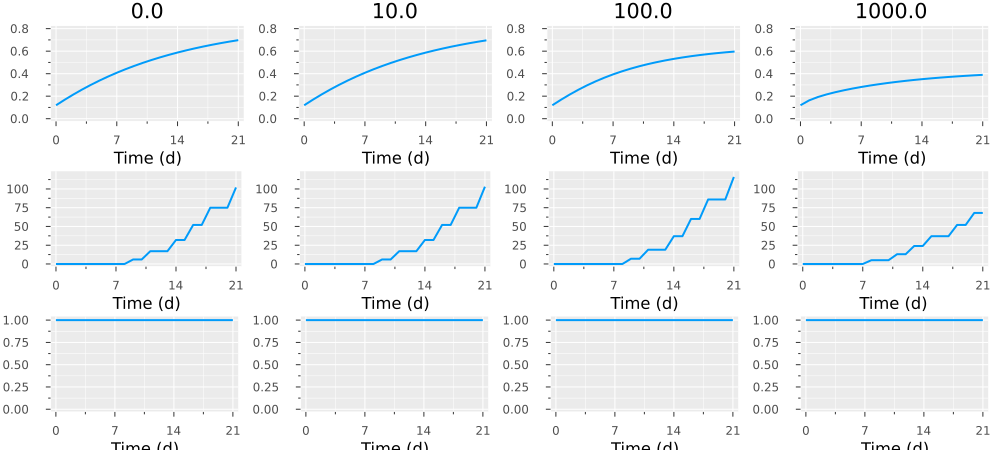

In [86]:
global_params = deepcopy(default_global_params)
global_params[:data_recording_interval] = 1.
global_params[:A_inoculate] = [0.4]

flea_params = deepcopy(default_fleas.DM_AMP) 
flea_params[:kappa_EX_min] = flea_params[:kappa_EX_max] = 1. #flea_params[:p_A_m_0] / flea_params[:J_X_A_m_0]
flea_params[:cv] = 0.
flea_params[:h_a_accel] = 0.
flea_params[:beta_e] = 0.1
flea_params[:TKTD][CU].TK[1].params = [.1]
flea_params[:TKTD][CU].link_TK = true
flea_params[:TKTD][CU].TD[KP].DRC = DRCModel(
    LL3GM,
    (100., 2., -.5)
)

outs = LifeTableDataset[]
C_sweep = [0., 10., 100., 1000.]
for C in C_sweep
    global_params[:C][1] = C
    out = life_table(global_params, phyto_params, flea_params; n_reps=10)
    out.repro.C .= C
    out.growth.C .= C
    out.survival.C .= C
    push!(outs, out)
end
out = concat(outs)

sort!(out.growth, :t_day)
sort!(out.repro, :t_day)
pg = @df out.growth plot(
    :t_day, :carapace_length, group=:C, 
    ylim=(0,0.8), layout=(1,4), title=hcat(C_sweep...), 
    size=(800,300), lw=1.5
)
pr = @df out.repro plot(:t_day, :cum_repro, group=:C, layout=(1,4), ylim=(0,120))
ps = @df out.survival plot(:t_day, :survival, group=:C, layout=(1,4), ylim=(0,1.01))
plot(pg, pr, ps, layout=(3,1), xticks=0:7:21, xlabel="Time (d)", lw=2, size=(1000, 450))

In [93]:
outs = LifeTableDataset[]
C_sweep = geomrange(0.1, 1000.)
for C in C_sweep
    global_params[:C][1] = C
    out = life_table(global_params, phyto_params, flea_params; n_reps=10)
    out.repro.C .= C
    out.growth.C .= C
    out.survival.C .= C
    push!(outs, out)
end
out = concat(outs)

LifeTableDataset(11000×60 DataFrame
   Row │ t_day  unique_id  species_idx  kappa     kappa_EX  q_p_rel  J_X       ⋯
       │ Any    Any        Any          Any       Any       Any      Any       ⋯
───────┼────────────────────────────────────────────────────────────────────────
     1 │ 0.0    1          1            0.66472   1.0       1.0      0.222054  ⋯
     2 │ 1.0    1          1            0.672075  1.0       1.0      0.459321
     3 │ 2.0    1          1            0.668482  1.0       1.0      0.758668
     4 │ 3.0    1          1            0.667277  1.0       1.0      1.10867
     5 │ 4.0    1          1            0.666679  1.0       1.0      1.49666   ⋯
     6 │ 5.0    1          1            0.666323  1.0       1.0      1.91205
     7 │ 6.0    1          1            0.666089  1.0       1.0      2.34598
     8 │ 7.0    1          1            0.665924  1.0       1.0      2.79109
   ⋮   │   ⋮        ⋮           ⋮          ⋮         ⋮         ⋮        ⋮      ⋱
 10994 │ 15.0 

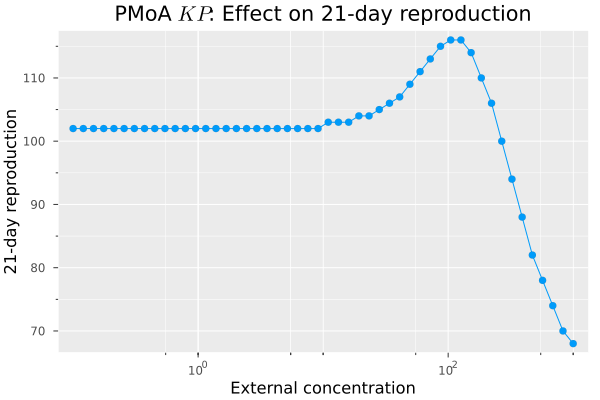

In [94]:
@df @subset(out.repro, :t_day.==maximum(:t_day)) lineplot(
    :C, :cum_repro, xscale=:log10, marker=true, xlabel="External concentration", ylabel="21-day reproduction",
    title=L"PMoA $KP$: Effect on 21-day reproduction"
    )

#### Embryonal investment

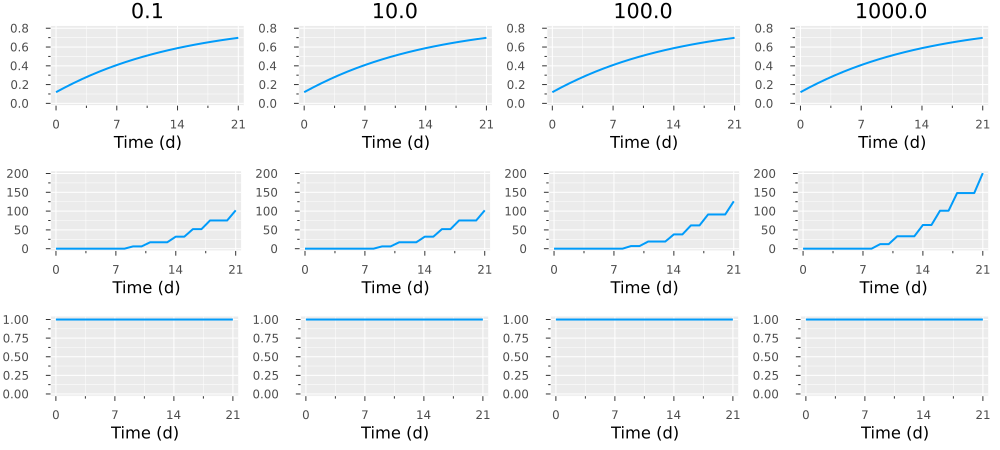

In [95]:
global_params = deepcopy(default_global_params)
global_params[:data_recording_interval] = 1.
global_params[:A_inoculate] = [0.4]

flea_params = deepcopy(default_fleas.DM_AMP) 
flea_params[:kappa_EX_min] = flea_params[:kappa_EX_max] = 1. #flea_params[:p_A_m_0] / flea_params[:J_X_A_m_0]
flea_params[:cv] = 0.
flea_params[:h_a_accel] = 0.
flea_params[:beta_e] = 0.1
flea_params[:TKTD][CU].TK[1].params = [.1]
flea_params[:TKTD][CU].link_TK = true
flea_params[:TKTD][CU].TD[EO].DRC = DRCModel(
    LL3AR,
    (100.0, 2.0, 0.5)
)

outs = LifeTableDataset[]
C_sweep = [0.1, 10., 100., 1000.]
for C in C_sweep
    global_params[:C][1] = C
    out = life_table(global_params, phyto_params, flea_params; n_reps=10)
    out.repro.C .= C
    out.growth.C .= C
    out.survival.C .= C
    push!(outs, out)
end
out = concat(outs)

sort!(out.growth, :t_day)
sort!(out.repro, :t_day)
pg = @df out.growth plot(
    :t_day, :carapace_length, group=:C, 
    ylim=(0,0.8), layout=(1,4), title=hcat(C_sweep...), 
    size=(800,300), lw=1.5
)
pr = @df out.repro plot(:t_day, :cum_repro, group=:C, layout=(1,4), ylim=(0,200))
ps = @df out.survival plot(:t_day, :survival, group=:C, layout=(1,4), ylim=(0,1.01))
plot(pg, pr, ps, layout=(3,1), xticks=0:7:21, xlabel="Time (d)", lw=2, size=(1000, 450), bottommargin=5mm)

In [96]:
# the same for more concentrations
outs = LifeTableDataset[]
C_sweep = geomrange(0.1, 1000.)
for C in C_sweep
    global_params[:C][1] = C
    out = life_table(global_params, phyto_params, flea_params; n_reps=10)
    out.repro.C .= C
    out.growth.C .= C
    out.survival.C .= C
    push!(outs, out)
end
out = concat(outs)

LifeTableDataset(11000×60 DataFrame
   Row │ t_day  unique_id  species_idx  kappa     kappa_EX  q_p_rel  J_X       ⋯
       │ Any    Any        Any          Any       Any       Any      Any       ⋯
───────┼────────────────────────────────────────────────────────────────────────
     1 │ 0.0    1          1            0.66472   1.0       1.0      0.222054  ⋯
     2 │ 1.0    1          1            0.672075  1.0       1.0      0.459321
     3 │ 2.0    1          1            0.668482  1.0       1.0      0.758668
     4 │ 3.0    1          1            0.667277  1.0       1.0      1.10867
     5 │ 4.0    1          1            0.666679  1.0       1.0      1.49666   ⋯
     6 │ 5.0    1          1            0.666323  1.0       1.0      1.91205
     7 │ 6.0    1          1            0.666089  1.0       1.0      2.34598
     8 │ 7.0    1          1            0.665924  1.0       1.0      2.79109
   ⋮   │   ⋮        ⋮           ⋮          ⋮         ⋮         ⋮        ⋮      ⋱
 10994 │ 15.0 

PMoA Embryonal investement leads to an increase in cumulative reproduction.

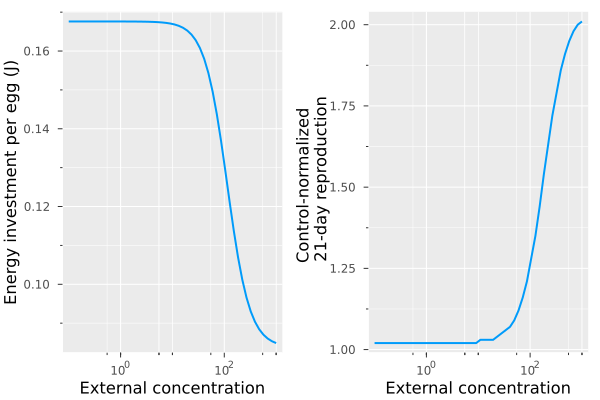

In [97]:
p = @df @subset(out.repro, :t_day.==maximum(:t_day)) plot(
    lineplot(
        :C, :E_o, xscale=:log10, xlabel="External concentration", ylabel="Energy investment per egg (J)", lw=2
    ),
    lineplot(
        :C, :cum_repro ./ 100., xscale=:log10,  xlabel="External concentration", ylabel="Control-normalized \n 21-day reproduction",
        lw=2,
        )
)
savefig(plot(p, dpi=300), "figures/pmoa_E_repro.png")
p

Each embryo starts with less energy, so there should be implications for neonate fitness.

In [98]:
global_params = deepcopy(default_global_params)
global_params[:data_recording_interval] = 1.
global_params[:A_inoculate] = [100.]

flea_params = deepcopy(default_fleas.DM_AMP) 
flea_params[:kappa_EX_min] = flea_params[:kappa_EX_max] = 1. #flea_params[:p_A_m_0] / flea_params[:J_X_A_m_0]
flea_params[:cv] = 0.
flea_params[:h_a_accel] = 0.
flea_params[:beta_e] = 0.1
flea_params[:TKTD][CU].TK[1].params = [.1]
flea_params[:TKTD][CU].link_TK = true
flea_params[:TKTD][CU].TD[EO].DRC = DRCModel(
    LL3AR,
    (100.0, 2.0, 0.5)
)

DRCModel(LL3AR, (100.0, 2.0, 0.5))

In [99]:
global_params[:remove_juveniles] = []

Any[]

In [104]:
neonate_fitness = DataFrame()

C_sweep = geomrange(0.1, 1000., length=10)
for C in C_sweep
    global_params[:C][1] = C
    m = initialize_model(global_params, phyto_params, [flea_params])
    run!(m)
    all_daphnids = daphnid_output(m, Inf)
    all_daphnids[:,:C] .= C
    append!(neonate_fitness, all_daphnids)
end

Different state variables at birth are plotted below.

PMoA embryonic investment decreases energy at birth and length at birth. <br>
Scaled reserves are barely affected, 
and age at birth is slightly decreased ()

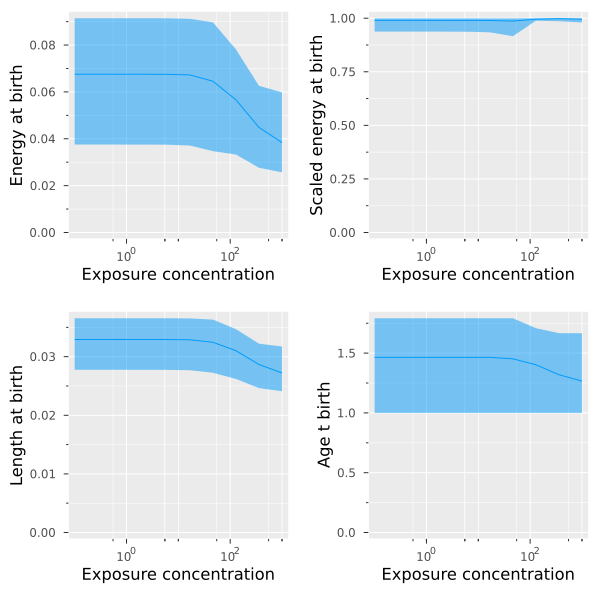

In [113]:
df = combine(groupby(@subset(neonate_fitness, :unique_id.>1), [:unique_id, :C])) do df
    birth = @subset(df, :t_day.==minimum(:t_day))
    DataFrame(
        e_b = birth.e,
        E_b = birth.E,
        L_b = birth.L,
        a_b = birth.age
    )
end 

 @df df plot(
    lineplot(:C, :E_b, ylim=(0, maximum(:E_b)), xscale=:log10, ylabel="Reserves at birth"),
    lineplot(:C, :e_b, ylim=(0, maximum(:e_b)), xscale=:log10, ylabel="Scaled reserves at birth"),
    lineplot(:C, :L_b, ylim=(0, maximum(:L_b)), xscale=:log10, ylabel="Length at birth"),
    lineplot(:C, :a_b, ylim=(0, maximum(:a_b)), xscale=:log10, ylabel="Age at birth"), 
    xlabel="Exposure concentration", size=(600,600)
)

#### Survival

In [114]:
include("src/DEB.jl")

apply_effects!

In [115]:
flea_params[:TKTD][CU].TD

7-element Vector{TDModel}:
 TDModel(DRCModel(LL3GM, (0.0, 0.0, 0.0)), :s_G_z, prod)
 TDModel(DRCModel(LL3GM, (0.0, 0.0, 0.0)), :s_M_z, prod)
 TDModel(DRCModel(LL3AR, (0.0, 0.0, 0.0)), :s_A_z, prod)
 TDModel(DRCModel(LL3AR, (0.0, 0.0, 0.0)), :s_R_z, prod)
 TDModel(DRCModel(LL3GUTS, (0.0, 0.0, 0.0)), :h_z, sum)
 TDModel(DRCModel(LL3AR, (100.0, 2.0, 0.5)), :s_E_o_z, prod)
 TDModel(DRCModel(LL3AR, (0.0, 0.0, 0.0)), :s_kappa_z, prod)

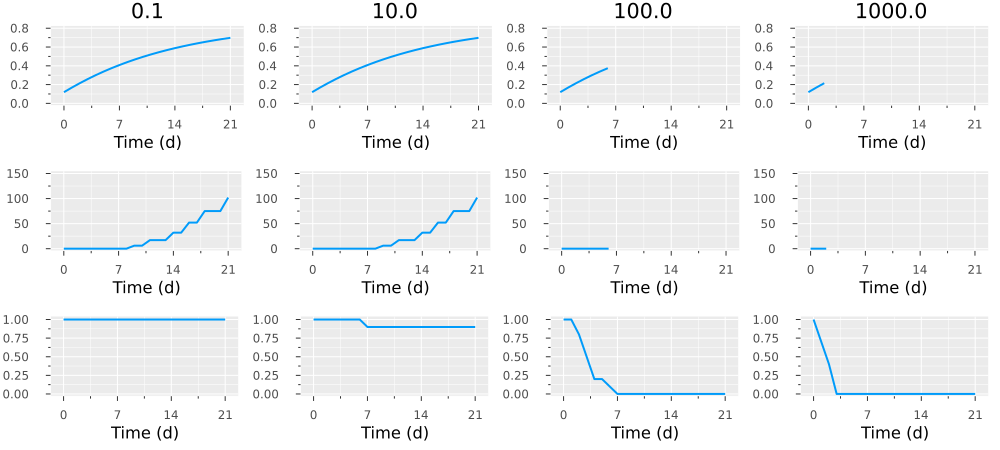

In [117]:
global_params = deepcopy(default_global_params)
global_params[:data_recording_interval] = 1.
global_params[:A_inoculate] = [0.4]

flea_params = deepcopy(default_fleas.DM_AMP) 
flea_params[:kappa_EX_min] = flea_params[:kappa_EX_max] = 1. #flea_params[:p_A_m_0] / flea_params[:J_X_A_m_0]
flea_params[:cv] = 0.
flea_params[:h_a_accel] = 0.
flea_params[:beta_e] = 0.1

flea_params[:TKTD][CU].TK[H].params = [1.]
flea_params[:TKTD][CU].link_TK = false
flea_params[:TKTD][CU].TD[H].DRC = DRCModel(
    LL3GUTS,
    (100.0, 2.0, 1.0)
)

outs = LifeTableDataset[]
C_sweep = [0.1, 10., 100., 1000.]
for C in C_sweep
    global_params[:C][1] = C
    out = life_table(global_params, phyto_params, flea_params; n_reps=10)
    out.repro.C .= C
    out.growth.C .= C
    out.survival.C .= C
    push!(outs, out)
end
out = concat(outs)

sort!(out.growth, :t_day)
sort!(out.repro, :t_day)
pg = @df out.growth plot(
    :t_day, :carapace_length, group=:C, 
    xlim=(-1,22), ylim=(0,0.8), layout=(1,4), title=hcat(C_sweep...), 
    size=(800,300), lw=1.5
)
pr = @df out.repro plot(
    :t_day, :cum_repro, group=:C, 
    layout=(1,4), xlim=(-1,22), ylim=(0,150)
    )
ps = @df out.survival plot(
    :t_day, :survival, group=:C, 
    layout=(1,4), ylim=(0,1.01)
    )
plot(
    pg, pr, ps, 
    layout=(3,1), xticks=0:7:21, 
    xlabel="Time (d)", lw=2, xlim=(-1,22),
    size=(1000, 450), bottommargin=5mm
    )